### 1) Import of packages

In [1]:
import xarray as xr

In [37]:
import pandas as pd
import numpy as np

import os
import numpy as np

import os
import numpy as np
os.environ['CMDSTAN'] = '/Users/carlo/.cmdstan/cmdstan-2.30.1'

import cmdstanpy

from cmdstanpy import cmdstan_path, CmdStanModel


import arviz as az
import seaborn as sns
import matplotlib.pyplot as plt

import math as m


### 2) Dataset Processing

Import of the dataset

In [124]:
data=pd.read_csv("tfidf_red_90.csv")
colnames=data.columns



Standardization of the dataset

In [125]:
from sklearn import preprocessing


In [126]:
data_mod1=preprocessing.scale(data)/2 # for model 1
data=preprocessing.scale(data)


In [127]:
data=pd.DataFrame(data)
data.columns=colnames

data_mod1=pd.DataFrame(data_mod1)
data_mod1.columns=colnames


In [128]:
data_mod1.describe()

,bore,disappoint,bad,wast,instead,easi,highli,excel,lack,poorli,...,comprehens,rambl,suspect,explor,guy,honestli,invit,extraordinari,outstand,type_text
count,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2000.000000,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,...,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2000.000000
mean,-7.105427e-18,-3.552714e-17,1.421085e-17,1.421085e-17,0.000000,-2.131628e-17,3.552714e-17,2.131628e-17,-2.131628e-17,1.421085e-17,...,-3.730349e-17,-3.552714e-18,-4.263256e-17,-3.552714e-18,-1.421085e-17,-7.105427e-18,-7.105427e-18,-1.776357e-18,1.776357e-18,0.000000
std,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,0.500125,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,...,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,5.001250e-01,0.500125
min,-1.042809e-01,-1.309159e-01,-1.185475e-01,-9.405977e-02,-0.121489,-1.080027e-01,-1.096773e-01,-9.789612e-02,-1.019407e-01,-6.040078e-02,...,-5.210570e-02,-4.197445e-02,-5.582606e-02,-6.966447e-02,-8.304707e-02,-4.294532e-02,-3.289673e-02,-3.382650e-02,-3.204643e-02,-0.500000
25%,-1.042809e-01,-1.309159e-01,-1.185475e-01,-9.405977e-02,-0.121489,-1.080027e-01,-1.096773e-01,-9.789612e-02,-1.019407e-01,-6.040078e-02,...,-5.210570e-02,-4.197445e-02,-5.582606e-02,-6.966447e-02,-8.304707e-02,-4.294532e-02,-3.289673e-02,-3.382650e-02,-3.204643e-02,-0.500000
50%,-1.042809e-01,-1.309159e-01,-1.185475e-01,-9.405977e-02,-0.121489,-1.080027e-01,-1.096773e-01,-9.789612e-02,-1.019407e-01,-6.040078e-02,...,-5.210570e-02,-4.197445e-02,-5.582606e-02,-6.966447e-02,-8.304707e-02,-4.294532e-02,-3.289673e-02,-3.382650e-02,-3.204643e-02,0.000000
75%,-1.042809e-01,-1.309159e-01,-1.185475e-01,-9.405977e-02,-0.121489,-1.080027e-01,-1.096773e-01,-9.789612e-02,-1.019407e-01,-6.040078e-02,...,-5.210570e-02,-4.197445e-02,-5.582606e-02,-6.966447e-02,-8.304707e-02,-4.294532e-02,-3.289673e-02,-3.382650e-02,-3.204643e-02,0.500000
max,4.880172e+00,5.190935e+00,6.644419e+00,8.002202e+00,5.775956,5.283900e+00,8.500341e+00,6.199533e+00,7.779323e+00,8.074607e+00,...,1.044350e+01,1.011516e+01,9.954887e+00,9.382061e+00,8.468912e+00,8.775660e+00,1.261076e+01,1.170186e+01,1.143952e+01,0.500000


In [129]:
y1=[0 for i in range (1000)]
y2=[1 for i in range(1000)]
y=y1+y2
y=np.array(y)

Select the columns obtained with Spike and Slab & Hard Shrinkage

Hard Shrinkage with HDI=90%

In [9]:
v_hard1=['bore', 'disappoint', 'bad', 'wast', 'instead', 'easi', 'highli',
       'excel', 'lack', 'poorli', 'unfortun', 'favorit', 'skip', 'sorri',
       'stupid', 'beauti', 'suppos', 'noth', 'predict', 'import', 'step',
       'share', 'fail', 'anyth', 'appli', 'journey', 'dull', 'whatev', 'flat',
       'useless', 'wors', 'endless', 'passion', 'vagu', 'claim', 'tire',
       'whatsoev', 'soon', 'lesson', 'ridicul', 'gift', 'humor', 'half',
       'bother', 'appreci', 'fascin', 'benefit', 'devot', 'vivid', 'substanc',
       'mistak', 'superfici', 'worst', 'steel', 'decent', 'expand',
       'establish', 'premis', 'paragraph', 'X100', 'garbag', 'remark',
       'shallow', 'glad', 'unrealist', 'weak', 'fantast', 'suspect',
       'honestli', 'invit', 'extraordinari']

Hard Shrinkage with HDI=95%

In [10]:
v_hard2 = ['bore', 'disappoint', 'bad', 'wast', 'instead', 'easi', 'highli',
       'excel', 'lack', 'poorli', 'unfortun', 'favorit', 'skip', 'sorri',
       'stupid', 'beauti', 'suppos', 'noth', 'predict', 'import', 'step',
       'share', 'fail', 'appli', 'journey', 'dull', 'whatev', 'flat',
       'useless', 'wors', 'endless', 'vagu', 'claim', 'whatsoev', 'soon',
       'ridicul', 'gift', 'humor', 'half', 'bother', 'fascin', 'devot',
       'vivid', 'substanc', 'mistak', 'worst', 'expand', 'establish', 'premis',
       'paragraph', 'X100', 'shallow', 'glad', 'weak', 'fantast', 'suspect',
       'extraordinari'  
]

In [134]:
data = data[:][v_hard1]
data1=data[:][v_hard2]
data_mod1=data_mod1[:][v_hard1]


Adding the "ones" column

In [136]:

data.insert(0, 'B_0', 1)


data1.insert(0, 'B_0', 1)

data_mod1.insert(0,'B_0' ,1)

data

,B_0,bore,disappoint,bad,wast,instead,easi,highli,excel,lack,...,remark,shallow,glad,unrealist,weak,fantast,suspect,honestli,invit,extraordinari
0,1,-0.208562,-0.261832,-0.237095,7.077524,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
1,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
2,1,-0.208562,-0.261832,-0.237095,7.077524,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
3,1,-0.208562,-0.261832,4.015391,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
4,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
1996,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
1997,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
1998,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,5.030370,-0.219355,2.552345,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653


### 3) Logistic models

##### 3.1) Model 1

This model requires a particular standardization: Covariates must be standardized to have mean=0 and std=0.5

\begin{equation}  
   Y_i | \mu_i \sim Be(\mu_i)\\
   \mu_i = inv-logit(x_i^t \beta) \\
   \beta_1 \sim  Cauchy(0,10)   \\
   \beta_i \sim Cauchy (0,2.5) , i>1 \\
\end{equation}

In [13]:
Logistic_regression_model_1_code = """
data{
  
   int<lower=0> N;
   
   int<lower=0> p;

   
   int y[N];
   
   matrix[N,p] x;
   
}



parameters {

    vector[p] beta;
    
}

transformed parameters{

     real <lower=0, upper=1> mu[N];
     
     for(i in 1:N)
     {
     
     mu[i]= inv_logit(x[i,:]*beta);
     }
}

model{


    y~ bernoulli(mu);
    
    beta[1]~cauchy(0,10);
    
    for (j in 2:p){

    beta~cauchy(0,2.5);
    }

}

generated quantities  {
      vector[N] log_lik;
      for (j in 1:N) {
            log_lik[j] = bernoulli_lpmf(y[j] | mu[j]);
      }
     
}


"""





stan_file_logistic_1 = "./logistic_regression_model_1.stan"

with open(stan_file_logistic_1, "w") as f:   # write the normal code into a file named ./multi_normal.stan
    print(Logistic_regression_model_1_code, file=f)

stan_model1 = CmdStanModel(stan_file=stan_file_logistic_1  ,  cpp_options={"STAN_THREADS": True})



15:32:58 - cmdstanpy - INFO - compiling stan file C:\Users\carlo\Bayesian statistics project\logistic_regression_model_1.stan to exe file C:\Users\carlo\Bayesian statistics project\logistic_regression_model_1.exe
15:33:19 - cmdstanpy - INFO - compiled model executable: C:\Users\carlo\Bayesian statistics project\logistic_regression_model_1.exe
15:33:19 - cmdstanpy - WARNING - Stan compiler has produced 2 warnings:
15:33:19 - cmdstanpy - WARNING - 
--- Translating Stan model to C++ code ---
bin/stanc.exe  --o=C:/Users/carlo/BAYESI~1/logistic_regression_model_1.hpp C:/Users/carlo/BAYESI~1/logistic_regression_model_1.stan
Warning in 'C:/Users/carlo/BAYESI~1/logistic_regression_model_1.stan', line 9, column 3: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc
Warning in 'C:/Users/carlo/BAYESI~1/lo

##### 3.1) Model 2

\begin{equation}  
   Y_i | \mu_i \sim Be(\mu_i)\\
   \mu_i = inv-logit(x_i^t \beta) \\
   \beta_i  \sim N_p(0 , c) \\
\end{equation}

We are going to try different values for c in order to state the degree of non-informativness.

In [14]:
Logistic_regression_model_2_code = """
data{
  
   int<lower=0> N;
   
   int<lower=0> p;
   
   int y[N];
   
   matrix[N,p] x;
   
   real sigma;
   

}



parameters {

    vector[p] beta;
    
}

transformed parameters{

     real <lower=0, upper=1> mu[N];
     
     for(i in 1:N)
     {
     
     mu[i]= inv_logit(x[i,:]*beta);
     }
}

model{

    y~ bernoulli(mu);

    
    beta~normal(0,sigma);

}

generated quantities  {
      vector[N] log_lik;
      for (j in 1:N) {
            log_lik[j] = bernoulli_lpmf(y[j] | mu[j]);
      }
}






    
"""





stan_file_logistic_2 = "./logistic_regression_model_2.stan"

with open(stan_file_logistic_2, "w") as f:   # write the normal code into a file named ./multi_normal.stan
    print(Logistic_regression_model_2_code, file=f)

stan_model2 = CmdStanModel(stan_file=stan_file_logistic_2 ,  cpp_options={"STAN_THREADS": True})


15:33:19 - cmdstanpy - INFO - compiling stan file C:\Users\carlo\Bayesian statistics project\logistic_regression_model_2.stan to exe file C:\Users\carlo\Bayesian statistics project\logistic_regression_model_2.exe
15:33:39 - cmdstanpy - INFO - compiled model executable: C:\Users\carlo\Bayesian statistics project\logistic_regression_model_2.exe
15:33:39 - cmdstanpy - WARNING - Stan compiler has produced 2 warnings:
15:33:39 - cmdstanpy - WARNING - 
--- Translating Stan model to C++ code ---
bin/stanc.exe  --o=C:/Users/carlo/BAYESI~1/logistic_regression_model_2.hpp C:/Users/carlo/BAYESI~1/logistic_regression_model_2.stan
Warning in 'C:/Users/carlo/BAYESI~1/logistic_regression_model_2.stan', line 8, column 3: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc
Warning in 'C:/Users/carlo/BAYESI~1/lo

##### 3.3) Model 3


\begin{equation}  
   Y_i | \mu_i \sim Be(\mu_i)\\
   \mu_i = inv-logit(x_i^t \beta) \\
   \beta_i  = z N(-3 , 0.5) +(1-z) N(3,0.5) \\
   z\sim Beta(0.5,0.5)
\end{equation}


To assign less mass to $\beta_i$=0

In [15]:
Logistic_regression_model_3_code = """
data {
  int<lower=0> N;  // number of observations
  int<lower=0> K;  // number of predictor variables
  matrix[N, K] X;  // predictor variables
  int<lower=0,upper=1> y[N];  // response variable
  
  real a;
  
  real mean;
  
  real varian;

}
parameters {
  vector[K] beta;  // coefficients
  real<lower=0, upper=1> z;  

}
transformed parameters {
  vector[N] mu;  // mean of the response variable
  mu = inv_logit(X * beta);  // linear predictor
}
model {
 
  z~beta(a,a);  
  
  
  
  target += log_mix(z, 
                         normal_lpdf(beta | -mean, varian),
                         normal_lpdf(beta | mean, varian));
  y ~ bernoulli(mu);  // response variable
}

generated quantities  {
      vector[N] log_lik;
      for (j in 1:N) {
            log_lik[j] = bernoulli_lpmf(y[j] | mu[j]);
      }
}









    
"""





stan_file_logistic_3 = "./logistic_regression_model_3.stan"

with open(stan_file_logistic_3, "w") as f:   # write the normal code into a file named ./multi_normal.stan
    print(Logistic_regression_model_3_code, file=f)

stan_model3 = CmdStanModel(stan_file=stan_file_logistic_3 ,   cpp_options={"STAN_THREADS": True})


15:33:39 - cmdstanpy - INFO - compiling stan file C:\Users\carlo\Bayesian statistics project\logistic_regression_model_3.stan to exe file C:\Users\carlo\Bayesian statistics project\logistic_regression_model_3.exe
15:33:59 - cmdstanpy - INFO - compiled model executable: C:\Users\carlo\Bayesian statistics project\logistic_regression_model_3.exe
15:33:59 - cmdstanpy - WARNING - Stan compiler has produced 1 warnings:
15:33:59 - cmdstanpy - WARNING - 
--- Translating Stan model to C++ code ---
bin/stanc.exe  --o=C:/Users/carlo/BAYESI~1/logistic_regression_model_3.hpp C:/Users/carlo/BAYESI~1/logistic_regression_model_3.stan
Warning in 'C:/Users/carlo/BAYESI~1/logistic_regression_model_3.stan', line 6, column 2: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc

--- Compiling, linking C++ code ---
g

##### Model 4

\begin{equation}  
   Y_i | \mu_i \sim Be(\mu_i)\\
   \mu_i = inv-logit(x_i^t \beta) \\
   \beta  \sim N_p(\underline{0},B_0)\\
   B_0 =\frac{1}{100}(X^tX)^{-1}
\end{equation}



In [16]:
Logistic_regression_model_4_code = """
data{
  
   int<lower=0> N;
   
   int<lower=0> p;
   
   int y[N];
   
   matrix[N,p] x;
   
   matrix[p , p] B0_inv;
   

}



parameters {

    vector[p] beta;
    
}

transformed parameters{

     real <lower=0, upper=1> mu[N];
     
     for(i in 1:N)
     {
     
     mu[i]= inv_logit(x[i,:]*beta);
     }
}

model{

vector[p] b = rep_vector(0, p);


   for( i in 1:N)
   {
   
    y[i]~ bernoulli(mu[i]);
    
    }
    
    beta~multi_normal(b,B0_inv);

}

generated quantities  {
      vector[N] log_lik;
      for (j in 1:N) {
            log_lik[j] = bernoulli_lpmf(y[j] | mu[j]);
      }
}






    
"""





stan_file_logistic_4 = "./logistic_regression_4.stan"

with open(stan_file_logistic_4, "w") as f:   # write the normal code into a file named ./multi_normal.stan
    print(Logistic_regression_model_4_code, file=f)

stan_model4 = CmdStanModel(stan_file=stan_file_logistic_4,   cpp_options={"STAN_THREADS": True})


15:34:00 - cmdstanpy - INFO - compiling stan file C:\Users\carlo\Bayesian statistics project\logistic_regression_4.stan to exe file C:\Users\carlo\Bayesian statistics project\logistic_regression_4.exe
15:34:22 - cmdstanpy - INFO - compiled model executable: C:\Users\carlo\Bayesian statistics project\logistic_regression_4.exe
15:34:22 - cmdstanpy - WARNING - Stan compiler has produced 2 warnings:
15:34:22 - cmdstanpy - WARNING - 
--- Translating Stan model to C++ code ---
bin/stanc.exe  --o=C:/Users/carlo/BAYESI~1/logistic_regression_4.hpp C:/Users/carlo/BAYESI~1/logistic_regression_4.stan
Warning in 'C:/Users/carlo/BAYESI~1/logistic_regression_4.stan', line 8, column 3: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.32.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc
Warning in 'C:/Users/carlo/BAYESI~1/logistic_regression_4.stan', line 27, 

###### Data processing for model assesment

In [138]:
data

,B_0,bore,disappoint,bad,wast,instead,easi,highli,excel,lack,...,remark,shallow,glad,unrealist,weak,fantast,suspect,honestli,invit,extraordinari
0,1,-0.208562,-0.261832,-0.237095,7.077524,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
1,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
2,1,-0.208562,-0.261832,-0.237095,7.077524,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
3,1,-0.208562,-0.261832,4.015391,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
4,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
1996,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
1997,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653
1998,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,5.030370,-0.219355,2.552345,-0.203881,...,-0.122293,-0.090254,-0.118341,-0.073263,-0.085061,-0.117232,-0.111652,-0.085891,-0.065793,-0.067653


In [137]:
data1

,B_0,bore,disappoint,bad,wast,instead,easi,highli,excel,lack,...,establish,premis,paragraph,X100,shallow,glad,weak,fantast,suspect,extraordinari
0,1,-0.208562,-0.261832,-0.237095,7.077524,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.079971,-0.106063,-0.109554,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653
1,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.079971,-0.106063,-0.109554,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653
2,1,-0.208562,-0.261832,-0.237095,7.077524,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.079971,-0.106063,-0.109554,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653
3,1,-0.208562,-0.261832,4.015391,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.079971,-0.106063,-0.109554,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653
4,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.079971,3.467400,-0.109554,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.079971,-0.106063,-0.109554,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653
1996,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.079971,-0.106063,-0.109554,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653
1997,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,-0.216005,-0.219355,-0.195792,-0.203881,...,-0.079971,-0.106063,-0.109554,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653
1998,1,-0.208562,-0.261832,-0.237095,-0.188120,-0.242978,5.030370,-0.219355,2.552345,-0.203881,...,-0.079971,-0.106063,5.919786,-0.109926,-0.090254,-0.118341,-0.085061,-0.117232,-0.111652,-0.067653


In [139]:
data_mod1

,B_0,bore,disappoint,bad,wast,instead,easi,highli,excel,lack,...,remark,shallow,glad,unrealist,weak,fantast,suspect,honestli,invit,extraordinari
0,1,-0.104281,-0.130916,-0.118547,3.538762,-0.121489,-0.108003,-0.109677,-0.097896,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827
1,1,-0.104281,-0.130916,-0.118547,-0.094060,-0.121489,-0.108003,-0.109677,-0.097896,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827
2,1,-0.104281,-0.130916,-0.118547,3.538762,-0.121489,-0.108003,-0.109677,-0.097896,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827
3,1,-0.104281,-0.130916,2.007695,-0.094060,-0.121489,-0.108003,-0.109677,-0.097896,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827
4,1,-0.104281,-0.130916,-0.118547,-0.094060,-0.121489,-0.108003,-0.109677,-0.097896,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1,-0.104281,-0.130916,-0.118547,-0.094060,-0.121489,-0.108003,-0.109677,-0.097896,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827
1996,1,-0.104281,-0.130916,-0.118547,-0.094060,-0.121489,-0.108003,-0.109677,-0.097896,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827
1997,1,-0.104281,-0.130916,-0.118547,-0.094060,-0.121489,-0.108003,-0.109677,-0.097896,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827
1998,1,-0.104281,-0.130916,-0.118547,-0.094060,-0.121489,2.515185,-0.109677,1.276173,-0.101941,...,-0.061147,-0.045127,-0.059171,-0.036631,-0.042531,-0.058616,-0.055826,-0.042945,-0.032897,-0.033827


In [140]:
x = np.array(data)
x.shape

(2000, 72)

In [141]:
x1=np.array(data1)
x1.shape

(2000, 58)

In [142]:
x_mod1=np.array(data_mod1)
x_mod1.shape

(2000, 72)

In [143]:
p1=x1.shape[1]
p1

58

In [144]:
p = x.shape[1]
p

72

In [145]:
p_mod1=x_mod1.shape[1]
p_mod1

72

In [146]:
y=np.array(y)
y = y.astype(int)

###### Split into trainin-set and test-set

In [24]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 100/2000, random_state=0)

x_train1, x_test1, y_train1, y_test1 = train_test_split(x1, y, test_size= 100/2000, random_state=0)   # for model 3

x_train2, x_test2, y_train2, y_test2 = train_test_split(x_mod1, y, test_size= 100/2000, random_state=0)  # for model 1

In [25]:
x_test.shape

(100, 72)

In [26]:
N = x_train.shape[0]

### 4) Application of Model 1

###### Sample from the posterior

In [27]:
data1 = {
    
    "N": N,
    "p": p_mod1,
    "y": y_train2,
    "x": x_train2,



}

stan_fit1 = stan_model1.sample(data=data1, chains=4, 
                             parallel_chains=4 , threads_per_chain=3)
cmdstanpy_data1 = az.from_cmdstanpy(stan_fit1)

15:34:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

15:35:16 - cmdstanpy - INFO - CmdStan done processing.


In [28]:
stan_fit1.summary()

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-981.029000,0.145607,6.114640,-991.534000,-980.791000,-971.362000,1763.50,15.7705,1.001900
beta[1],-0.107362,0.000885,0.057056,-0.203021,-0.106748,-0.016790,4155.68,37.1630,1.000950
beta[2],-0.624517,0.002003,0.132427,-0.848265,-0.619873,-0.412463,4372.39,39.1010,0.999332
beta[3],-0.448011,0.001537,0.109485,-0.631853,-0.446160,-0.272548,5074.36,45.3785,0.999349
beta[4],-0.616618,0.001993,0.136491,-0.845618,-0.614052,-0.395786,4689.71,41.9387,0.999563
...,...,...,...,...,...,...,...,...,...
log_lik[1896],-0.883552,0.000525,0.042049,-0.954517,-0.881702,-0.817129,6403.26,57.2624,0.999520
log_lik[1897],-0.529519,0.002101,0.134141,-0.772305,-0.514041,-0.339954,4077.83,36.4668,1.000010
log_lik[1898],-0.534323,0.000371,0.029648,-0.582967,-0.534567,-0.486269,6380.32,57.0574,0.999519
log_lik[1899],-0.883552,0.000525,0.042049,-0.954517,-0.881702,-0.817129,6403.26,57.2624,0.999520


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\plots\traceplot.py:216: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (1972), generating only 20 plots
  UserWarning,


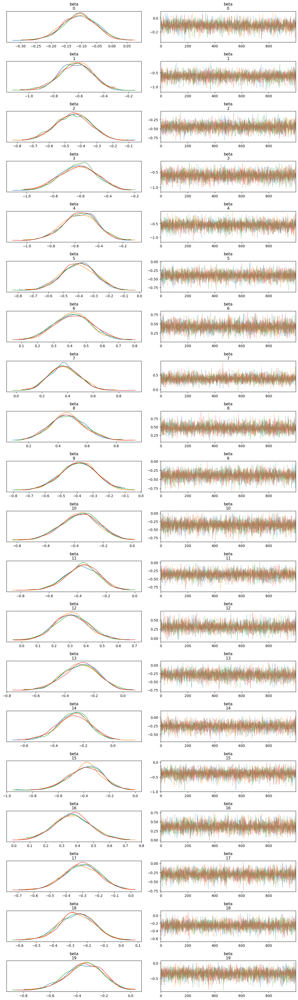

In [29]:
az.plot_trace(cmdstanpy_data1, compact=False)
plt.tight_layout()
plt.show()

In [30]:
print("LM-WAIC: ", az.waic(cmdstanpy_data1, var_name="log_lik"))

LM-WAIC:  Computed from 4000 posterior samples and 1900 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -904.55    16.96
p_waic       32.26        -

There has been a warning during the calculation. Please check the results.


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "


In [32]:
beta_chains1=cmdstanpy_data1.posterior.beta

beta_chains1

<xarray.DataArray 'beta' (chain: 4, draw: 1000, beta_dim_0: 72)>
array([[[ 0.0155706, -0.421997 , -0.280745 , ..., -0.253187 ,
          0.180681 ,  0.37081  ],
        [-0.0663417, -0.472506 , -0.487441 , ..., -0.064578 ,
          0.158628 ,  0.19109  ],
        [-0.096038 , -0.689711 , -0.434693 , ..., -0.394462 ,
          0.275789 ,  0.342442 ],
        ...,
        [-0.102805 , -0.677275 , -0.483336 , ..., -0.16842  ,
          0.115126 ,  0.232793 ],
        [-0.115313 , -0.626917 , -0.481078 , ..., -0.403007 ,
          0.595652 ,  0.513796 ],
        [ 0.0196743, -0.588939 , -0.503869 , ..., -0.13871  ,
          0.149327 ,  0.279353 ]],

       [[-0.184512 , -0.739173 , -0.556069 , ..., -0.505466 ,
          0.201021 ,  0.176021 ],
        [-0.057657 , -0.595317 , -0.402914 , ..., -0.660247 ,
          0.037257 ,  0.359978 ],
        [-0.109192 , -0.818914 , -0.437756 , ..., -0.637207 ,
          0.0131106,  0.326862 ],
...
        [-0.132195 , -0.419258 , -0.51612  , ..., -0.111574 ,
          0.130136 ,  0.192804 ],
        [-0.0629033, -0.715937 , -0.343182 , ..., -0.364169 ,
          0.238111 ,  0.338495 ],
        [-0.11971  , -0.566305 , -0.535574 , ..., -0.195275 ,
          0.379287 ,  0.14145  ]],

       [[-0.184951 , -0.8208   , -0.446971 , ..., -0.219074 ,
          0.192944 ,  0.234845 ],
        [-0.225513 , -0.778846 , -0.425273 , ..., -0.484566 ,
          0.220166 ,  0.215793 ],
        [-0.218536 , -0.741695 , -0.489935 , ..., -0.421036 ,
          0.186718 ,  0.270379 ],
        ...,
        [-0.149885 , -0.789299 , -0.423765 , ..., -0.255007 ,
          0.207322 ,  0.387478 ],
        [-0.0925788, -0.477238 , -0.451616 , ..., -0.296756 ,
          0.195852 ,  0.0962799],
        [-0.0422183, -0.613621 , -0.349831 , ..., -0.53634  ,
          0.262424 ,  0.409203 ]]])
Coordinates:
  * chain       (chain) int32 0 1 2 3
  * draw        (draw) int32 0 1 2 3 4 5 6 7 ... 992 993 994 995 996 997 998 999
  * beta_dim_0  (beta_dim_0) int32 0 1 2 3 4 5 6 7 8 ... 64 65 66 67 68 69 70 71

###### Predictions on the test_set

Predictions computed as:

\begin{equation}  
         Y_{new_i} = \left\{
    \begin{aligned}
    1\quad if \quad\mu_{new_i} \ge &  0.5 \\
    0\quad otherwise &\\
    \end{aligned}
  \right.\\
  \mu_{new_i}= X_{new_i}^t \widehat{\beta}\\
  \widehat{\beta_j}  \approx \frac{1}{1000}\sum_{i=1}^{1000}\beta_j^i
\end{equation}

Where $\beta_i$ are realisations from the sampling of the posterior of $\beta$

In [33]:
beta_hat1=beta_chains1.mean(dim=["draw","chain"])


In [34]:
def compute_mu(betaa,xx):
    
    mu=[]
    
    for i in range(len(xx)):
        
        muu=m.e**(np.dot(xx[i].T,betaa))/(1+m.e**(np.dot(xx[i].T,betaa)))
        
        mu.append(muu)
        
    return mu
    

In [38]:
posterior_mu1=compute_mu(beta_hat1,x_test2)

In [39]:
posterior_mu1

[0.43431835874944835,
 0.5864305816357529,
 0.5864305816357529,
 0.12004129081044403,
 0.22285212102164692,
 0.5600209818316589,
 0.9470314576574753,
 0.5678767917767356,
 0.5864305816357529,
 0.40422101290563045,
 0.5612129550351646,
 0.4277398615148182,
 0.3432638822694855,
 0.36272847167831274,
 0.06731161000783868,
 0.6377842574657896,
 0.29110772232331933,
 0.36301582480765254,
 0.5864305816357529,
 0.7708755883396597,
 0.19915831931854402,
 0.7950370088511484,
 0.11643152894349097,
 0.5864305816357529,
 0.4787433198905207,
 0.7641403586911457,
 0.159451245631112,
 0.5864305816357529,
 0.3631849377888164,
 0.7042737931176571,
 0.4116561622210163,
 0.8157045173323723,
 0.5864305816357529,
 0.5864305816357529,
 0.6799788085612467,
 0.6617960566434005,
 0.7177644409836524,
 0.05413494111565579,
 0.11771290692149627,
 0.31534446505535235,
 0.32612971649920386,
 0.11042395946856211,
 0.5864305816357529,
 0.8153281355868747,
 0.7028511178261266,
 0.38492442275087424,
 0.5864305816357529

In [112]:
def predictions(mu_hat, threshold):
    
    L= len(mu_hat)
    
    out=np.zeros(L)
    
    
    for i in range(L):
        
        if mu_hat[i]>threshold:
            out[i]+=1
            
    return out

In [42]:
pred1=predictions(posterior_mu1,0.5)

In [43]:
pred1

array([0., 1., 1., 0., 0., 1., 1., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0.,
       0., 1., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 1., 1.,
       1., 1., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 1., 0., 0., 1., 1.,
       1., 1., 0., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0., 1.,
       1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1.,
       0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 0., 1., 0.])

In [44]:
confusion_matrix1 = pd.crosstab(y_test2, pred1, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix1)

Pred  0.0  1.0
Real          
0      30   16
1       9   45


In [45]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test2, pred1, average='binary')
print(f1_score)
print(precision)
print(recall)

0.782608695652174
0.7377049180327869
0.8333333333333334


###### Accuracy on training

In [46]:
posterior_mu_train1=compute_mu(beta_hat1,x_train2)

In [47]:
pred_train1=predictions(posterior_mu_train1,0.5)

In [48]:
confusion_matrix_tr_1 = pd.crosstab(y_train2, pred_train1, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix_tr_1)

Pred  0.0  1.0
Real          
0     672  282
1     124  822


In [49]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_train2, pred_train1, average='binary')
print(f1_score)
print(precision)
print(recall)

0.8019512195121951
0.7445652173913043
0.86892177589852


### 5) Application of model 2

###### Using a generic value for the c


In [50]:
data2 = {
    
    "N": N,
    "p": p,
    "y": y_train,
    "x": x_train,
    "sigma":6        # c=6 --> var=35



}

stan_fit2 = stan_model2.sample(data=data2, chains=4, 
                             parallel_chains=4, threads_per_chain=3)
cmdstanpy_data2 = az.from_cmdstanpy(stan_fit2)

15:38:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

15:41:12 - cmdstanpy - INFO - CmdStan done processing.


15:41:14 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 59 divergent transitions (5.9%)
	Chain 2 had 5 divergent transitions (0.5%)
	Chain 3 had 27 divergent transitions (2.7%)
	Use function "diagnose()" to see further information.


In [51]:
stan_fit2.summary()

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-856.262000,0.175246,6.310000,-867.208000,-855.838000,-846.459000,1296.47,3.25813,1.003210
beta[1],-1.417840,0.010182,0.429261,-2.177710,-1.384740,-0.777583,1777.39,4.46672,1.000860
beta[2],-0.632984,0.002188,0.141841,-0.888482,-0.622022,-0.417106,4203.50,10.56370,0.999853
beta[3],-0.307000,0.001117,0.077164,-0.435479,-0.305317,-0.186255,4770.68,11.98910,0.999486
beta[4],-0.634007,0.001925,0.127693,-0.852666,-0.628086,-0.429369,4398.70,11.05430,1.000390
...,...,...,...,...,...,...,...,...,...
log_lik[1896],-0.961861,0.000768,0.052633,-1.049740,-0.960949,-0.876745,4695.23,11.79950,0.999695
log_lik[1897],-0.454591,0.003644,0.216307,-0.865114,-0.408298,-0.194100,3523.81,8.85561,0.999303
log_lik[1898],-0.482945,0.000473,0.032570,-0.538247,-0.482073,-0.430976,4736.23,11.90250,0.999635
log_lik[1899],-0.961861,0.000768,0.052633,-1.049740,-0.960949,-0.876745,4695.23,11.79950,0.999695


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\plots\traceplot.py:216: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (1972), generating only 20 plots
  UserWarning,


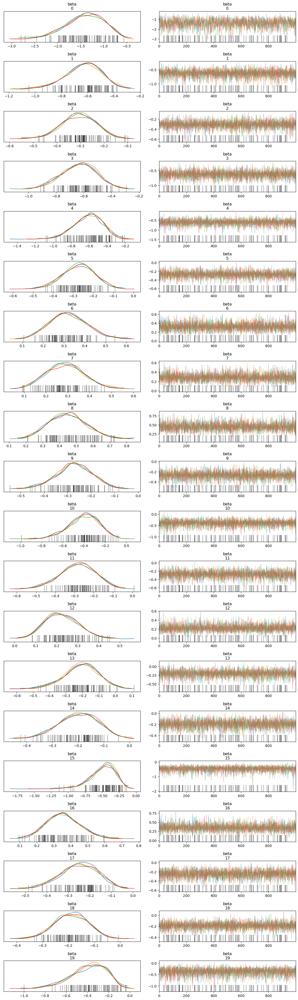

In [52]:
az.plot_trace(cmdstanpy_data2, compact=False)
plt.tight_layout()
plt.show()

In [53]:
print("LM-WAIC: ", az.waic(cmdstanpy_data2, var_name="log_lik"))

LM-WAIC:  Computed from 4000 posterior samples and 1900 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -901.01    27.62
p_waic       80.96        -

There has been a warning during the calculation. Please check the results.


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "


In [54]:
beta_chains2=cmdstanpy_data2.posterior.beta

beta_chains2

<xarray.DataArray 'beta' (chain: 4, draw: 1000, beta_dim_0: 72)>
array([[[-1.94758  , -0.816588 , -0.251535 , ..., -0.110927 ,
          0.110836 ,  0.723082 ],
        [-1.43632  , -0.535938 , -0.296652 , ..., -0.424532 ,
          0.399964 ,  0.387094 ],
        [-1.25178  , -0.747436 , -0.358788 , ..., -0.121272 ,
          0.1185   ,  0.508988 ],
        ...,
        [-0.995176 , -0.738365 , -0.332368 , ..., -0.018476 ,
          0.439959 ,  0.528881 ],
        [-1.08556  , -0.725169 , -0.312678 , ..., -0.156385 ,
          0.248959 ,  0.639363 ],
        [-1.54459  , -0.707098 , -0.256578 , ..., -0.229914 ,
          0.278657 ,  0.973074 ]],

       [[-1.00138  , -0.39973  , -0.293467 , ..., -0.366694 ,
          0.0574   ,  0.53386  ],
        [-1.46104  , -0.789191 , -0.310813 , ..., -0.343574 ,
          0.584574 ,  0.41988  ],
        [-0.877114 , -0.516255 , -0.2768   , ..., -0.205979 ,
          0.0173765,  0.633287 ],
...
        [-2.70061  , -0.667231 , -0.218783 , ..., -0.234406 ,
          0.134083 ,  0.454837 ],
        [-2.65006  , -0.614668 , -0.211171 , ..., -0.161889 ,
          0.0839493,  0.396818 ],
        [-0.868616 , -0.574999 , -0.387295 , ..., -0.481112 ,
          0.48618  ,  0.404526 ]],

       [[-1.6071   , -0.646886 , -0.420747 , ..., -0.589081 ,
          0.47827  ,  0.468289 ],
        [-1.0223   , -0.494977 , -0.356068 , ..., -0.120033 ,
          0.148846 ,  0.330217 ],
        [-1.18576  , -0.651172 , -0.293838 , ..., -0.407125 ,
          0.245438 ,  0.498571 ],
        ...,
        [-1.06773  , -0.774593 , -0.42334  , ..., -0.669469 ,
          0.562    ,  0.492471 ],
        [-1.29376  , -0.487145 , -0.210042 , ..., -0.106908 ,
          0.43685  ,  0.309836 ],
        [-0.949373 , -0.467364 , -0.393534 , ..., -0.329001 ,
          0.0985059,  0.551685 ]]])
Coordinates:
  * chain       (chain) int32 0 1 2 3
  * draw        (draw) int32 0 1 2 3 4 5 6 7 ... 992 993 994 995 996 997 998 999
  * beta_dim_0  (beta_dim_0) int32 0 1 2 3 4 5 6 7 8 ... 64 65 66 67 68 69 70 71

In [55]:
beta_hat2=beta_chains2.mean(dim=["draw","chain"])

In [56]:
posterior_mu2=compute_mu(beta_hat2,x_test)

In [57]:
posterior_mu2

[0.2698610488875088,
 0.6174919387572493,
 0.6174919387572493,
 0.010636962495559196,
 0.05689695661908966,
 0.5441324128091769,
 0.9969900838918411,
 0.5381127581823236,
 0.6174919387572493,
 0.3629344104339303,
 0.5513544144228305,
 0.32430710702609905,
 0.2430450484541782,
 0.13784670388159997,
 0.024267251622877822,
 0.760917357739824,
 0.09051148565572267,
 0.31640700523049037,
 0.6174919387572493,
 0.8477161719390176,
 0.010242453389449395,
 0.8837687751473952,
 0.014039858099629711,
 0.6174919387572493,
 0.5357076715779419,
 0.8521235412987493,
 0.0562690775598913,
 0.6174919387572493,
 0.31965767215874896,
 0.7820045713312693,
 0.38633003183719616,
 0.9428884567138209,
 0.6174919387572493,
 0.6174919387572493,
 0.7505863318196577,
 0.8914159738825842,
 0.8321289707267072,
 6.00587336324235e-43,
 0.04354014271827817,
 0.16931647198560093,
 0.2733231683154345,
 0.023098727865599473,
 0.6174919387572493,
 0.9657847252194675,
 0.9198729537235417,
 0.2648385127034504,
 0.61749193875

In [58]:
pred2=predictions(posterior_mu2,0.5)

In [59]:
pred2

array([0., 1., 1., 0., 0., 1., 1., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0.,
       0., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 0., 1., 0., 1., 1., 1.,
       1., 1., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 1., 0., 0., 1., 1.,
       1., 1., 0., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0., 1.,
       1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 0., 1., 0.])

In [60]:
confusion_matrix2 = pd.crosstab(y_test, pred2, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix2)

Pred  0.0  1.0
Real          
0      30   16
1       9   45


In [61]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, pred2, average='binary')
print(f1_score)
print(precision)
print(recall)

0.782608695652174
0.7377049180327869
0.8333333333333334


###### Assess the optimal c

In [96]:
c_vec=[m.sqrt(10),m.sqrt(20),m.sqrt(30),m.sqrt(40),m.sqrt(50),m.sqrt(60),m.sqrt(70),m.sqrt(80),m.sqrt(90),m.sqrt(100)]

waic_res=[]

for c in c_vec:
    
    data = {
    
    "N": N,
    "p": p,
    "y": y_train,
    "x": x_train,
    "sigma":c



     }

    stan_fit_C = stan_model2.sample(data=data, chains=1,inits=0, threads_per_chain=12)
    cmdstanpy_data_C = az.from_cmdstanpy(stan_fit_C)
    
    waic_res.append(az.waic(cmdstanpy_data_C, var_name="log_lik")[0])
    

15:48:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

15:49:29 - cmdstanpy - INFO - CmdStan done processing.


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
15:49:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

15:50:39 - cmdstanpy - INFO - CmdStan done processing.


15:50:39 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 3 divergent transitions (0.3%)
	Use function "diagnose()" to see further information.
C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
15:50:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

15:51:55 - cmdstanpy - INFO - CmdStan done processing.


15:51:56 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 103 divergent transitions (10.3%)
	Use function "diagnose()" to see further information.
C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
15:51:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

15:53:51 - cmdstanpy - INFO - CmdStan done processing.


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
15:53:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

15:55:38 - cmdstanpy - INFO - CmdStan done processing.


15:55:38 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 57 divergent transitions (5.7%)
	Use function "diagnose()" to see further information.
C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
15:55:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

15:57:49 - cmdstanpy - INFO - CmdStan done processing.


15:57:49 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Use function "diagnose()" to see further information.
C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
15:57:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

16:00:20 - cmdstanpy - INFO - CmdStan done processing.


16:00:21 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.4%)
	Use function "diagnose()" to see further information.
C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
16:00:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

16:02:30 - cmdstanpy - INFO - CmdStan done processing.


16:02:30 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 5 divergent transitions (0.5%)
	Use function "diagnose()" to see further information.
C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
16:02:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

16:04:56 - cmdstanpy - INFO - CmdStan done processing.


16:04:56 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 12 divergent transitions (1.2%)
	Use function "diagnose()" to see further information.
C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
16:04:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

16:06:57 - cmdstanpy - INFO - CmdStan done processing.


16:06:57 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 51 divergent transitions (5.1%)
	Use function "diagnose()" to see further information.
C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "


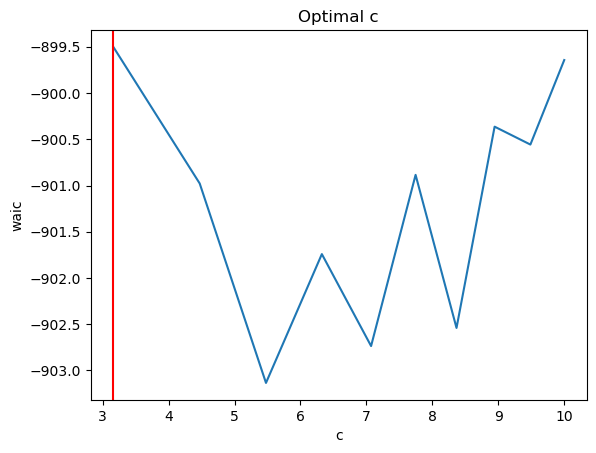

In [120]:
import matplotlib.pyplot 
  
  
# plotting the points 
matplotlib.pyplot.plot(c_vec, waic_res)
  
# naming the x axis
matplotlib.pyplot.xlabel('c')
# naming the y axis
matplotlib.pyplot.ylabel('waic')
  
# giving a title to my graph
matplotlib.pyplot.title('Optimal c')

matplotlib.pyplot.axvline(x=m.sqrt(10),color="r")



  
# function to show the plot
matplotlib.pyplot.show()

###### Try the optimal c

In [100]:
data_op_c = {
    
    "N": N,
    "p": p,
    "y": y_train,
    "x": x_train,
    "sigma":m.sqrt(10)



}

stan_fit_op_c = stan_model2.sample(data=data_op_c, chains=4, 
                             parallel_chains=4 ,inits=0, threads_per_chain=3)
cmdstanpy_data_op_c = az.from_cmdstanpy(stan_fit_op_c)

16:07:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

16:09:46 - cmdstanpy - INFO - CmdStan done processing.


16:09:47 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.4%)
	Chain 3 had 6 divergent transitions (0.6%)
	Chain 4 had 3 divergent transitions (0.3%)
	Use function "diagnose()" to see further information.


In [101]:
stan_fit_op_c.summary()

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-856.940000,0.166329,6.284540,-867.706000,-856.598000,-847.170000,1427.62,5.92416,1.000540
beta[1],-0.903969,0.005738,0.243919,-1.326320,-0.883922,-0.533634,1807.15,7.49910,1.000710
beta[2],-0.634679,0.002230,0.142664,-0.885019,-0.627061,-0.415787,4091.58,16.97880,0.999300
beta[3],-0.304385,0.001041,0.076015,-0.433248,-0.302116,-0.184028,5332.66,22.12890,0.999208
beta[4],-0.631658,0.001741,0.126745,-0.842982,-0.627169,-0.430036,5300.51,21.99540,1.000460
...,...,...,...,...,...,...,...,...,...
log_lik[1896],-0.961510,0.000804,0.051430,-1.049890,-0.960259,-0.877590,4096.89,17.00080,0.999636
log_lik[1897],-0.458133,0.003858,0.214661,-0.865321,-0.417473,-0.200177,3096.20,12.84830,1.000920
log_lik[1898],-0.483101,0.000497,0.031850,-0.537654,-0.482517,-0.430819,4111.62,17.06190,0.999598
log_lik[1899],-0.961510,0.000804,0.051430,-1.049890,-0.960259,-0.877590,4096.89,17.00080,0.999636


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\plots\traceplot.py:216: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (1972), generating only 20 plots
  UserWarning,


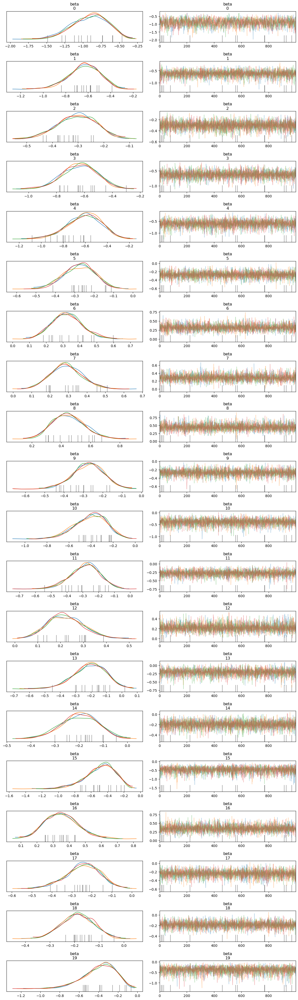

In [102]:
az.plot_trace(cmdstanpy_data_op_c, compact=False)
plt.tight_layout()
plt.show()

In [103]:
print("LM-WAIC: ", az.waic(cmdstanpy_data_op_c, var_name="log_lik"))

LM-WAIC:  Computed from 4000 posterior samples and 1900 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -901.15    27.58
p_waic       80.83        -

There has been a warning during the calculation. Please check the results.


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "


In [182]:
beta_chains_op_c=cmdstanpy_data_op_c.posterior.beta

beta_chains_op_c

<xarray.DataArray 'beta' (chain: 4, draw: 1000, beta_dim_0: 72)>
array([[[-0.847006  , -0.387393  , -0.226026  , ..., -0.369797  ,
          0.356744  ,  0.378196  ],
        [-0.969299  , -0.740906  , -0.362969  , ..., -0.0821575 ,
          0.481786  ,  0.671434  ],
        [-1.04604   , -0.652515  , -0.396035  , ..., -0.181226  ,
          0.393967  ,  0.622645  ],
        ...,
        [-0.697019  , -0.490361  , -0.213657  , ..., -0.661579  ,
         -0.0281322 ,  0.44629   ],
        [-1.0166    , -0.610082  , -0.400673  , ..., -0.0475732 ,
          0.500835  ,  0.761317  ],
        [-1.34851   , -0.663624  , -0.243757  , ..., -0.533841  ,
          0.0397692 ,  0.400923  ]],

       [[-0.729411  , -0.906969  , -0.334477  , ..., -0.308177  ,
          0.134319  ,  0.748508  ],
        [-0.802061  , -0.715435  , -0.220152  , ..., -0.463648  ,
          0.261659  ,  0.906912  ],
        [-0.840564  , -0.475709  , -0.286762  , ..., -0.525415  ,
          0.220947  ,  0.335924  ],
...
        [-0.535084  , -0.50093   , -0.237965  , ..., -0.282619  ,
          0.22603   ,  0.679031  ],
        [-0.545916  , -0.918825  , -0.244188  , ..., -0.150043  ,
          0.256771  ,  0.503543  ],
        [-0.552107  , -0.945807  , -0.262866  , ..., -0.0730332 ,
          0.302207  ,  0.531356  ]],

       [[-1.09977   , -1.07405   , -0.350008  , ..., -0.391798  ,
          0.141199  ,  0.427352  ],
        [-1.07882   , -1.11703   , -0.229224  , ..., -0.223977  ,
          0.136817  ,  0.586766  ],
        [-0.901814  , -0.192191  , -0.368947  , ..., -0.222014  ,
          0.155512  ,  0.528281  ],
        ...,
        [-1.52551   , -0.551689  , -0.34583   , ..., -0.357784  ,
          0.387778  ,  0.722731  ],
        [-1.37892   , -0.516191  , -0.265193  , ..., -0.510431  ,
          0.396587  ,  0.637765  ],
        [-0.782334  , -0.746727  , -0.322188  , ..., -0.076513  ,
          0.486233  ,  0.791652  ]]])
Coordinates:
  * chain       (chain) int32 0 1 2 3
  * draw        (draw) int32 0 1 2 3 4 5 6 7 ... 992 993 994 995 996 997 998 999
  * beta_dim_0  (beta_dim_0) int32 0 1 2 3 4 5 6 7 8 ... 64 65 66 67 68 69 70 71

In [183]:
beta_hat_op_c=beta_chains_op_c.mean(dim=["draw","chain"])

In [184]:
posterior_mu_op_c=compute_mu(beta_hat_op_c,x_test)

In [185]:
def predictions(mu_hat, threshold):
    
    L= len(mu_hat)
    
    out=np.zeros(L)
    
    
    for i in range(L):
        
        if mu_hat[i]>threshold:
            out[i]+=1
            
    return out

In [113]:
pred_op_c=predictions(posterior_mu_op_c,0.5)

In [114]:
confusion_matrix_op_c = pd.crosstab(y_test, pred_op_c, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix_op_c)

Pred  0.0  1.0
Real          
0      30   16
1       9   45


In [115]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, pred_op_c, average='binary')
print(f1_score)
print(precision)
print(recall)

0.782608695652174
0.7377049180327869
0.8333333333333334


###### Accuracy sul training

In [116]:
posterior_mu_train2=compute_mu(beta_hat2,x_train)

In [117]:
pred_train2=predictions(posterior_mu_train2,0.5)

In [118]:
confusion_matrix_tr_2 = pd.crosstab(y_train, pred_train2, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix_tr_2)

Pred  0.0  1.0
Real          
0     677  277
1     131  815


In [119]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_train, pred_train2, average='binary')
print(f1_score)
print(precision)
print(recall)

0.7998037291462219
0.7463369963369964
0.861522198731501


### 6) Application of model 3

In [167]:
data3 = {
    
    "N": N,
    "K": p1,
    "y": y_train1,
    "X": x_train1,
    "a":0.5,
    "mean":2.5,
    "varian":1   # sigma=0.5 --> sigma^2=0.25
    
    



}

stan_fit3 = stan_model3.sample(data=data3, chains=2, 
                             parallel_chains=2, inits=0 , threads_per_chain=6)
cmdstanpy_data3 = az.from_cmdstanpy(stan_fit3)

16:27:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

16:27:26 - cmdstanpy - INFO - CmdStan done processing.


In [177]:
stan_fit3.summary()

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-1095.710000,0.193872,5.628560,-1105.530000,-1095.280000,-1087.100000,842.878,44.8363,1.005750
beta[1],-0.909331,0.003943,0.151067,-1.164260,-0.907920,-0.664606,1467.660,78.0714,1.000510
beta[2],-0.678684,0.003060,0.147052,-0.934464,-0.669224,-0.461731,2308.930,122.8220,0.999128
beta[3],-0.339462,0.001333,0.074292,-0.464411,-0.337447,-0.220381,3106.260,165.2350,0.999424
beta[4],-0.678201,0.002263,0.124658,-0.884369,-0.675623,-0.473827,3034.000,161.3920,0.999567
...,...,...,...,...,...,...,...,...,...
log_lik[1896],-0.984042,0.001001,0.049354,-1.064780,-0.983194,-0.902781,2432.100,129.3740,0.999207
log_lik[1897],-0.308614,0.001629,0.084361,-0.464684,-0.300279,-0.187393,2682.060,142.6700,0.999051
log_lik[1898],-0.469243,0.000600,0.029566,-0.519978,-0.468579,-0.422839,2431.040,129.3170,0.999188
log_lik[1899],-0.984042,0.001001,0.049354,-1.064780,-0.983194,-0.902781,2432.100,129.3740,0.999207


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\plots\traceplot.py:216: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (1959), generating only 20 plots
  UserWarning,


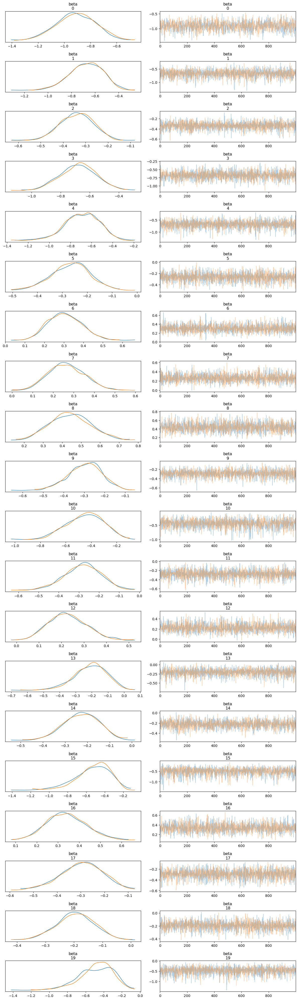

In [178]:
az.plot_trace(cmdstanpy_data3, compact=False)
plt.tight_layout()
plt.show()

In [168]:
print("LM-WAIC: ", az.waic(cmdstanpy_data3, var_name="log_lik"))

LM-WAIC:  Computed from 2000 posterior samples and 1900 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -915.07    26.81
p_waic       63.39        -

There has been a warning during the calculation. Please check the results.


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\stats\stats.py:1663: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "


In [169]:
beta_chains3=cmdstanpy_data3.posterior.beta

beta_chains3

<xarray.DataArray 'beta' (chain: 2, draw: 1000, beta_dim_0: 58)>
array([[[-0.637925 , -0.807145 , -0.461319 , ...,  0.219717 ,
         -0.244375 ,  0.357741 ],
        [-0.724626 , -0.746187 , -0.336022 , ...,  0.290655 ,
         -0.259866 ,  0.538961 ],
        [-0.799664 , -0.565021 , -0.327305 , ...,  0.144558 ,
         -0.114235 ,  0.874778 ],
        ...,
        [-1.06931  , -0.781128 , -0.409711 , ...,  0.17882  ,
         -0.107167 ,  0.883591 ],
        [-0.945582 , -0.752644 , -0.248505 , ...,  0.164154 ,
         -0.266394 ,  0.447477 ],
        [-0.980406 , -0.515556 , -0.421714 , ...,  0.23257  ,
         -0.0547199,  0.520655 ]],

       [[-0.679479 , -0.464524 , -0.335108 , ...,  0.351868 ,
         -0.254143 ,  0.413418 ],
        [-1.0428   , -0.852172 , -0.352852 , ...,  0.0646693,
         -0.0797346,  0.475213 ],
        [-1.0014   , -0.692051 , -0.401496 , ...,  0.136597 ,
         -0.065374 ,  0.379385 ],
        ...,
        [-0.72248  , -0.654394 , -0.303073 , ...,  0.323062 ,
         -0.190208 ,  0.533764 ],
        [-1.00133  , -0.516731 , -0.340332 , ...,  0.0308289,
         -0.197061 ,  0.459575 ],
        [-1.04873  , -0.949781 , -0.355095 , ...,  0.335597 ,
         -0.0677922,  0.697071 ]]])
Coordinates:
  * chain       (chain) int32 0 1
  * draw        (draw) int32 0 1 2 3 4 5 6 7 ... 992 993 994 995 996 997 998 999
  * beta_dim_0  (beta_dim_0) int32 0 1 2 3 4 5 6 7 8 ... 50 51 52 53 54 55 56 57

In [170]:
beta_hat3=beta_chains3.mean(dim=["draw","chain"])

In [171]:
sum(abs(beta_hat3))

<xarray.DataArray 'beta' ()>
array(26.94872935)

In [172]:
posterior3=compute_mu(beta_hat3,x_test1)

In [173]:
posterior3

[0.29951708701834867,
 0.6259307807825851,
 0.6259307807825851,
 0.06735141814232974,
 0.047373248793215264,
 0.5319559286943654,
 0.995205309791252,
 0.5187823717041912,
 0.6259307807825851,
 0.36994829482355396,
 0.5519139272575132,
 0.3115848521477416,
 0.26746643409561527,
 0.12384737171118096,
 0.018528520280978414,
 0.6404486261865193,
 0.11463889081993883,
 0.29597329599205263,
 0.6259307807825851,
 0.86722047107484,
 0.06558189592170202,
 0.8738238647697552,
 0.010248321358780173,
 0.6259307807825851,
 0.49287045707364785,
 0.843046576467927,
 0.04506149909787807,
 0.6259307807825851,
 0.3342343363592915,
 0.776719427438045,
 0.6259307807825851,
 0.8993080672264795,
 0.6259307807825851,
 0.6259307807825851,
 0.7475635939605546,
 0.9716452638813057,
 0.8308666971293862,
 4.489503911643221e-17,
 0.05254188109235265,
 0.16841024611803546,
 0.28779792929436665,
 0.09843868559261817,
 0.6259307807825851,
 0.9580681678578351,
 0.8959277358944049,
 0.1552083390661025,
 0.6259307807825

In [174]:
pred3=predictions(posterior3,0.5)

In [175]:
confusion_matrix3 = pd.crosstab(y_test1, pred3, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix3)

Pred  0.0  1.0
Real          
0      30   16
1       9   45


In [176]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test1, pred3, average='binary')
print(f1_score)
print(precision)
print(recall)

0.782608695652174
0.7377049180327869
0.8333333333333334


###### Accuracy sul training

In [74]:
posterior_mu_train3=compute_mu(beta_hat3,x_train1)

In [75]:
pred_train3=predictions(posterior_mu_train3,0.5)

In [76]:
confusion_matrix_tr_3 = pd.crosstab(y_train1, pred_train3, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix_tr_3)

Pred  0.0  1.0
Real          
0     661  293
1     140  806


In [77]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_train, pred_train3, average='binary')
print(f1_score)
print(precision)
print(recall)

0.7882640586797065
0.7333939945404914
0.8520084566596194


### 7) Application of Model 4

In [78]:
B0_inv=(1/100)*np.linalg.inv(np.dot(x_train.T,x_train))

In [79]:
data4 = {
    
    "N": N,
    "p": p,
    "y": y_train,
    "x": x_train,
    "B0_inv":B0_inv



}

stan_fit4 = stan_model4.sample(data=data4, chains=4,  parallel_chains=4,inits=0 , threads_per_chain=3)
cmdstanpy_data4 = az.from_cmdstanpy(stan_fit4)

15:45:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

15:46:14 - cmdstanpy - INFO - CmdStan done processing.


In [80]:
stan_fit4.summary()

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-1352.440000,0.129687,5.831720,-1362.630000,-1352.100000,-1343.470000,2022.10,17.8819,1.000610
beta[1],-0.000053,0.000032,0.002308,-0.003751,-0.000091,0.003860,5152.81,45.5674,0.999390
beta[2],-0.000511,0.000036,0.002438,-0.004597,-0.000506,0.003520,4529.31,40.0537,0.999580
beta[3],-0.000465,0.000036,0.002358,-0.004247,-0.000476,0.003379,4268.93,37.7511,0.999558
beta[4],-0.000499,0.000038,0.002504,-0.004602,-0.000447,0.003615,4427.05,39.1494,1.001530
...,...,...,...,...,...,...,...,...,...
log_lik[1896],-0.693487,0.000025,0.001709,-0.696379,-0.693441,-0.690665,4598.89,40.6690,0.999527
log_lik[1897],-0.692515,0.000091,0.006329,-0.702990,-0.692491,-0.682202,4874.88,43.1097,0.999557
log_lik[1898],-0.692810,0.000025,0.001708,-0.695640,-0.692854,-0.689929,4598.38,40.6645,0.999527
log_lik[1899],-0.693487,0.000025,0.001709,-0.696379,-0.693441,-0.690665,4598.89,40.6690,0.999527


C:\Users\carlo\anaconda3\envs\stan_env\lib\site-packages\arviz\plots\traceplot.py:216: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (1972), generating only 20 plots
  UserWarning,


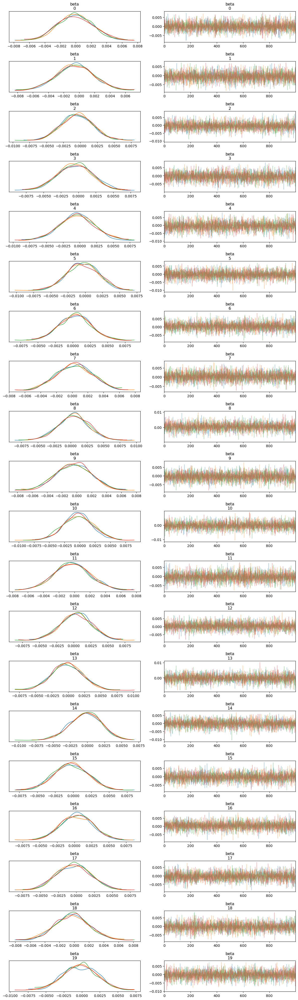

In [81]:
az.plot_trace(cmdstanpy_data4, compact=False)
plt.tight_layout()
plt.show()

In [82]:
print("LM-WAIC: ", az.waic(cmdstanpy_data4, var_name="log_lik"))

LM-WAIC:  Computed from 4000 posterior samples and 1900 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -1315.48     0.05
p_waic        0.18        -


In [83]:
beta_chains4=cmdstanpy_data4.posterior.beta

beta_chains4

<xarray.DataArray 'beta' (chain: 4, draw: 1000, beta_dim_0: 72)>
array([[[ 6.87177e-04, -9.60914e-04,  3.35754e-03, ..., -5.41616e-03,
         -8.89942e-04, -1.16462e-03],
        [ 3.88547e-03,  2.34883e-03, -3.33700e-03, ..., -1.70358e-03,
          1.57855e-03, -2.56587e-03],
        [ 2.92564e-04, -3.32554e-03,  3.88841e-03, ...,  2.75646e-03,
          2.78819e-04,  6.85302e-05],
        ...,
        [-1.86280e-03,  2.58417e-03, -2.88645e-03, ..., -1.46792e-03,
         -7.50439e-04,  9.35869e-04],
        [-3.77723e-03,  2.09007e-03, -2.92346e-03, ...,  1.83512e-04,
          8.66637e-04, -1.04267e-03],
        [-3.85686e-03,  1.71529e-03, -3.31779e-03, ...,  1.47024e-04,
          1.07544e-03, -2.18780e-03]],

       [[-1.00866e-03,  2.73688e-04,  2.47838e-03, ...,  2.78145e-03,
         -2.96819e-04, -1.57087e-03],
        [-2.92017e-03, -2.66222e-03,  1.53778e-05, ..., -2.29899e-03,
         -4.07311e-04, -8.91438e-04],
        [ 3.35639e-03,  2.45621e-03, -1.60436e-03, ...,  1.75792e-03,
         -5.41809e-03,  9.97421e-05],
...
        [-2.63692e-04, -2.55989e-04, -2.22315e-03, ...,  6.89722e-04,
          3.10155e-03, -8.09590e-04],
        [ 7.75318e-04,  3.14231e-03, -1.47949e-03, ...,  2.11134e-03,
          1.89128e-03, -1.74381e-03],
        [ 1.02024e-03,  2.31593e-03, -3.54930e-03, ...,  2.32554e-03,
          3.45882e-03, -2.10617e-03]],

       [[-4.23026e-03, -9.61865e-04,  1.23393e-03, ..., -3.75495e-04,
         -8.95129e-04,  6.50023e-04],
        [ 4.21868e-03, -1.77798e-03, -2.37568e-03, ..., -8.19073e-04,
          4.19918e-04,  9.93809e-04],
        [-4.20174e-03,  1.44888e-03,  2.39404e-04, ...,  2.06070e-04,
          3.22701e-04,  5.60115e-04],
        ...,
        [ 1.94062e-03,  4.66536e-03, -5.64746e-04, ...,  1.54660e-03,
         -2.25884e-03,  1.88921e-03],
        [-1.03783e-03, -3.27838e-03, -2.50299e-03, ...,  1.70526e-03,
          1.18014e-03, -4.95665e-04],
        [-1.67779e-03, -1.56847e-03, -5.12684e-03, ..., -3.06859e-03,
          3.01017e-03, -1.16043e-03]]])
Coordinates:
  * chain       (chain) int32 0 1 2 3
  * draw        (draw) int32 0 1 2 3 4 5 6 7 ... 992 993 994 995 996 997 998 999
  * beta_dim_0  (beta_dim_0) int32 0 1 2 3 4 5 6 7 8 ... 64 65 66 67 68 69 70 71

In [84]:
beta_hat4=beta_chains4.mean(dim=["draw","chain"])

In [85]:
posterior4=compute_mu(beta_hat4,x_test)

In [86]:
pred4=predictions(posterior4,0.5)

In [87]:
confusion_matrix4 = pd.crosstab(y_test, pred4, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix4)

Pred  0.0  1.0
Real          
0      30   16
1       9   45


In [88]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, pred4, average='binary')
print(f1_score)
print(precision)
print(recall)

0.782608695652174
0.7377049180327869
0.8333333333333334


### 8) Frequentist logistic regression

In [89]:
import pandas as pd
from sklearn.linear_model import LogisticRegression




# Fit the logistic regression model
model = LogisticRegression().fit(x_train, y_train)

# Print the intercept and coefficients
print("Intercept:", model.intercept_)
print("Coefficients:", model.coef_)

Intercept: [-0.34057686]
Coefficients: [[ 0.00114672 -0.55595954 -0.29059278 -0.58628742 -0.54679128 -0.26395631
   0.29839404  0.26565913  0.40788341 -0.25895658 -0.34865388 -0.26192129
   0.204164   -0.17789248 -0.17878439 -0.4030635   0.31550952 -0.2245668
  -0.18083065 -0.31835069  0.20849151  0.31114119  0.2178864  -0.22930277
  -0.14167906  0.23686817  0.32471277 -0.75444947 -0.26018429 -0.34854188
  -0.36742437 -0.21766618 -0.27959125  0.16177705 -0.86099771 -0.29515961
  -0.14179441 -0.48359208  0.25918446  0.12008709 -0.3272231   0.32931869
   0.26143662 -0.1615222  -0.16285866  0.10810136  0.41166514  0.124064
  -0.17600357  0.50910751 -0.2961446  -0.17333914 -0.16075784 -0.24640348
  -0.12230431 -0.14474028  0.17824867  0.21958419 -0.16406944 -0.27641363
  -0.25557835 -0.28199074  0.17179737 -0.2153285   0.23152826 -0.27888636
  -0.24510464  0.18839039 -0.17316403 -0.22923923  0.17844249  0.3937075 ]]


In [90]:
predictions = model.predict(x_test)


In [91]:
confusion_matrix = pd.crosstab(y_test, predictions, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix)

Pred   0   1
Real        
0     30  16
1      9  45


In [92]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, predictions, average='binary')
print(f1_score)
print(precision)
print(recall)

0.782608695652174
0.7377049180327869
0.8333333333333334


In [93]:
predictions_tr = model.predict(x_train)

In [94]:
confusion_matrix = pd.crosstab(y_train, predictions_tr, rownames=['Real'], colnames=['Pred'])
print (confusion_matrix)

Pred    0    1
Real          
0     676  278
1     127  819
